In [1]:
import numpy as np
import pandas as pd
import plotly.graph_objs as go

In [2]:
# Load data and clean up

df_phone = pd.read_csv("data/orange_bg/OrangeBG_phone.csv")
df_server = pd.read_csv("data/orange_bg/OrangeBG_server.csv")
trimmed_columns = {col: col.strip() for col in df_server.columns}
df_server = df_server.rename(columns=trimmed_columns)
trimmed_columns = {col: col.strip() for col in df_phone.columns}
df_phone = df_phone.rename(columns=trimmed_columns)
df_merged = df_phone.merge(df_server, how="inner", on="Message id")
df_merged.sort_values(by="Time_y")
df_merged["Time_y"] = df_merged["Time_y"].astype(int)
df_merged["time_difference_y"] = df_merged['Time_y'].diff()
df_merged.sort_values(by="Time_x")
df_merged["Time_x"] = df_merged["Time_x"].astype(int)
df_merged["time_difference_x"] = df_merged['Time_x'].diff()
df_merged["Sender Port_x"] = df_merged["Sender Port_x"].astype(int)
df_merged["Sender Port_y"] = df_merged["Sender Port_y"].astype(int)


print(f"Number of rows {len(df_merged.index)}")
# Visualize 

# Create a line chart using Plotly
df = df_merged


Number of rows 264479


In [3]:
fig = go.Figure()

# Add a line trace
fig.add_trace(go.Scatter(x=df_merged['Time_x'], y=df_merged['Sender Port_y'], mode='lines+markers', name='Port_y'))

# Update layout
fig.update_layout(title='Line and Marker Chart of Time and Port Number of Lyca Belgium',
                  xaxis_title='Time',
                  yaxis_title='Port Number')

# Show the plot
fig.show()

In [4]:
print(df['Sender Port_y'].min())
print(df['Sender Port_y'].max())
print(len(df['Sender Port_y'].unique()))
df['Sender Port_y'].value_counts()

5632
25343
767


Sender Port_y
5832     491
10085    468
5834     460
5833     457
10047    450
        ... 
25141    201
25151    200
25158    177
10084    155
5831      74
Name: count, Length: 767, dtype: int64

In [5]:
l = [[0]]
THRESHOLD = 1
prev = df.iloc[0]
for index, row in df.iterrows():
    

    if abs(row["Sender Port_y"] - prev["Sender Port_y"]) > THRESHOLD or row["Time_x"] - prev["Time_x"] > 10000:
        l[-1].append(index -1)
        l.append([index])


    prev = row
len(l)

261233

In [6]:
grouped = df.groupby(["Sender Port_x", "Sender Port_y"],as_index=False).size()
grouped[grouped['size'] >1]

,Sender Port_x,Sender Port_y,size
109,1048,5787,2
360,1106,10183,2
3079,1761,9993,2
4198,2037,9993,2
4204,2039,10020,2
...,...,...,...
261778,65039,25099,2
262015,65094,10226,2
263170,65371,10105,2
263518,65454,10164,2


/tmp/ipykernel_4100022/116624255.py:8: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



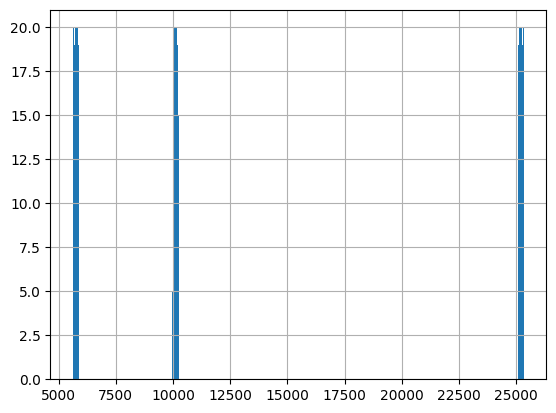

In [10]:
df2 = pd.DataFrame({"data":sorted(df['Sender Port_y'].unique())})
hist = df2['data'].hist(bins=1000)
fig = hist.get_figure()
# fig.set_xlabel("Port Number")
# fig.set_ylabel("Frequency")
# fig.set_title("Histogram of Port Number Frequency on Odido NL")
fig.savefig("figures/orangebg_hist_1000_bins.png")
fig.show()

In [11]:
uniques = df['Sender Port_y'].unique()
uniques.sort()
uniques

array([ 5632,  5633,  5634,  5635,  5636,  5637,  5638,  5639,  5640,
        5641,  5642,  5643,  5644,  5645,  5646,  5647,  5648,  5649,
        5650,  5651,  5652,  5653,  5654,  5655,  5656,  5657,  5658,
        5659,  5660,  5661,  5662,  5663,  5664,  5665,  5666,  5667,
        5668,  5669,  5670,  5671,  5672,  5673,  5674,  5675,  5676,
        5677,  5678,  5679,  5680,  5681,  5682,  5683,  5684,  5685,
        5686,  5687,  5688,  5689,  5690,  5691,  5692,  5693,  5694,
        5695,  5696,  5697,  5698,  5699,  5700,  5701,  5702,  5703,
        5704,  5705,  5706,  5707,  5708,  5709,  5710,  5711,  5712,
        5713,  5714,  5715,  5716,  5717,  5718,  5719,  5720,  5721,
        5722,  5723,  5724,  5725,  5726,  5727,  5728,  5729,  5730,
        5731,  5732,  5733,  5734,  5735,  5736,  5737,  5738,  5739,
        5740,  5741,  5742,  5743,  5744,  5745,  5746,  5747,  5748,
        5749,  5750,  5751,  5752,  5753,  5754,  5755,  5756,  5757,
        5758,  5759,

In [12]:
len(uniques)

767